# Feature Visualisation for Sport Image Classification 

**Introduction:**   Welcome to our interactive notebook dedicated to exploring feature visualisation for sport image classification. In this demonstration, we dive into the power of feature visualisation as a tool for understanding Convolutional Neural Networks (CNNs) and enhancing model interpretability.  

Feature visualisation enables us to generate visual representations of the features learned by CNN layers. By visualising these features, we gain insights into how the network processes and interprets input data, thus facilitating a better understanding of its decision-making procisions. We primarily follow the approach outlined in the [Feature Visualizationlion](https://distill.pub/2017/feature-visualization/), which advocates for the use of feature visualisation to enhance model interpretability.  We propose to use apply feature visualisation through the omnixai pacakge which is available on our [XAI platform](https://hes-xplain.github.io/) platform, you can effortlessly extract and visualise features from a CNN model. We provide functionalities to explore and interpret these features, aiding in the analysis and understanding of the model's decision-making process.    

Our goal is to showcase how feature visualisation empowers users to gain deeper insights into CNN models and make informed decisions based on their interpretations. By the end of this demonstration, you'll have a comprehensive understanding of feature visualisation and its application in sport image classification.sificati   

**Outline:**  
1. Setup and Problem Statement.
2. Feature Visualisation Explanation
3. Feature Visualisation usage of omnixai
4. Results and analysis
5. Conclusion
6. Reference.


---
## Google Colab setup

This section prepares the notebook for use with Google Colaboratory. If applicable, change the following variable to **True**:

In [1]:
# Colab compatibility
use_colab = False

Prepare the code by downloading the code and installing required packages.

In [2]:
if use_colab:
    # ensure the directory is empty
    !rm -rf * .config

    !# install codebase from GitHub
    !git clone --no-checkout https://github.com/HES-XPLAIN/notebooks.git --depth=1 .
    !git config core.sparseCheckout true
    !git sparse-checkout set --cone
    !git sparse-checkout add use_case_sport_classification
    !git sparse-checkout reapply
    !git checkout main

    # adjust folder structure
    !mv use_case_sport_classification/* .
    !rm -rf use_case_sport_classification/

In [3]:
if use_colab:
    # Install dependencies
    !pip install omnixai rules_extraction

When asked to, restart the session by clicking on the **"Restart Session"** button, then continue and execute the next cells.

## Workspace setup

This section download the required code and models from our GitHub and huggingface.co repositories.

Download the dataset and models.

In [4]:
# download and extract dataset
import zipfile
from huggingface_hub import hf_hub_download

REPO_ID = "HES-XPLAIN/SportsImageClassification"
FILENAME = "SportsImageClassification.zip"
dataset_file_path = hf_hub_download(repo_id=REPO_ID, filename=FILENAME, repo_type="dataset")
extract_path = 'data'

# Unzip the file
with zipfile.ZipFile(dataset_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print(f"Dataset successfully extracted to: {extract_path}")


KeyboardInterrupt



In [ ]:
!mkdir -p models_weight
!curl -OL https://huggingface.co/HES-XPLAIN/sport_classification/resolve/main/VGGSportsImageClassification.pth -o VGGSportsImageClassification.pth
!mv *.pth models_weight/

---
## Setup and Problem Statement

The sport image classification dataset used in this use case consists of approximately 15,000 images, covering 100 different sports categories. This dataset, available on [Kaggle](https://www.kaggle.com/datasets/gpiosenka/sports-classification), contains a total of 13,493 train images, 500 test images, and 500 validation images. The images are in JPG format and have dimensions of 224x224 pixels with 3 color channels.

**Download dataset**: To make a propoer use of this demo, the dataset will be automatically downloaded and extracted in the data folder. You can download it using the next cell or from our [Hugging Face repository](https://huggingface.co/datasets/HES-XPLAIN/SportsImageClassification).

**Problem Statement**: Our objective is to build a robust image classifier capable of accurately classifying sport images among the 100 predefined sports categories. The nature of the dataset, comprising images of various sports, makes it particularly suitable for introducing and visualizing XAI techniques.

In [4]:
# global imports

import torch
import json
import pandas as pd
import numpy as np
import torch.nn as nn

from PIL import Image
from torch.utils.data import DataLoader

from scripts.helpers import *

In [5]:
# use cuda if available

if torch.cuda.is_available():
    device = torch.device("cuda")
    print("Using CUDA (GPU)")
else:
    device = torch.device("cpu")
    print("CUDA (GPU) not available. Using CPU.")

Using CUDA (GPU)


In [6]:
from scripts.models import FineTunedVGG

# load trained model VGG
model = FineTunedVGG()
model = model.to(device)
model.eval()

# Specify the map_location argument when loading the model
load_path = "models_weight/VGGSportsImageClassification.pth"
checkpoint = torch.load(load_path, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])

# get loaders  using function define in scripts for this notebook
train_loader, valid_loader, test_loader = get_dataloaders()

# get a dictionary that links class names to integers, making it easier for us as we proceed in the notebook
with open('./data/idx_to_names.json', 'r') as file:
    idx_to_names = json.load(file)
names_to_idx = {v: k for k, v in idx_to_names.items()}

## Feature Visualisation 

Feature visualisation in the context of sport image classification refers to the process of generating visual representations of features learned by Convolutional Neural Networks (CNNs) during training. These visualisations provide insights into how the network interprets input data, revealing patterns and characteristics that influence classification decisions.

Feature visualisation is invaluable for understanding CNN models in sport image classification as it offers transparency and interpretability. By visualising learned features, we can uncover the specific attributes and patterns that the model relies on for classification. This allows us to verify the model's reasoning and identify potential biases or inconsistencies in its decision-making proces
 


Moreover, feature visualisation plays a crucial role in Explainable AI (XAI) by enhancing model interpretability. It enables stakeholders to understand and trust the decisions made by AI systems, fostering transparency and accountability. By incorporating feature visualisation into XAI workflows, we can ensure that AI models are not only accurate but also comprehensible and trustworthy, thus facilitating their widespread adoption and acceptance.


## Feature visualisation by optimization

Feature visualisation by optimization is a technique used to generate visual representations of features learned by neural networks by iteratively optimizing input images to maximally activate specific neurons, layers, or channels within the network. This approach involves starting from random noise or an arbitrary image and using optimization algorithms, typically gradient descent, to iteratively adjust the image to produce desired activations in the network.

OmniXAI offers a comprehensive solution for feature visualisation by optimization, providing tools and techniques to facilitate the generation of interpretable visual representations of neural network features. With OmniXAI, users can specify target neurons, layers, or channels within the network and define optimization objectives to guide the generation process.

The workflow typically involves initializing an input image, defining an objective function that quantifies the desired activation of the target features, and iteratively optimizing the input image to maximize this objective function. By repeatedly perturbing the input image in the direction that increases the desired activation, the optimization process gradually converges towards an image that elicits maximal activation in the target features.

This approach enables users to gain insights into the inner workings of neural networks by visualizing the features learned by different layers or neurons. By interpreting the generated images, users can better understand the representations encoded by the network and identify patterns or concepts that influence its decision-making process.

Overall, feature visualisation by optimization, facilitated by OmniXAI, provides a powerful tool for exploring and interpreting neural network representations, enhancing transparency and understanding in AI systems.


In [7]:
# let's look in our model 
# we can see there are a lot of layers, with a lof channels and a lot of neurons

model

FineTunedVGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, d

---
As explained in the [omnixai documentation](https://opensource.salesforce.com/OmniXAI/latest/index.html) or the [feature visualisation article](https://distill.pub/2017/feature-visualization/) we have to decide where to look. We can choose a layer or a channel or a neuron as target. 

Let's try using a random layer and then a random channel using the FeatureVisualizer API :

We need to set up an optimizer by choosing the target layer and the objective. Then we can generate explanations, meaning do the iteration process, and plot the result

The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).


Step: 900 |████████████████████████████████████████| 100.0% 


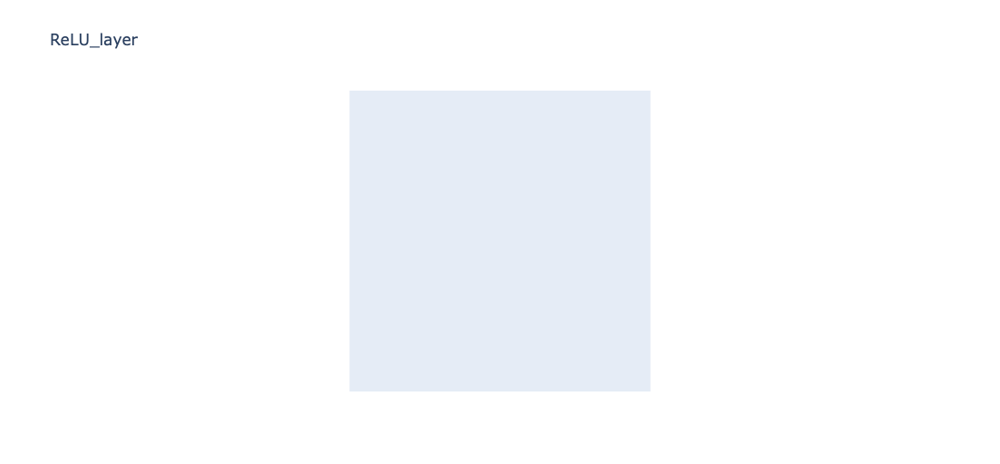

In [8]:
from omnixai.explainers.vision.specific.feature_visualization.visualizer import FeatureVisualizer

target_layer = model.features[29]
optimizer = FeatureVisualizer(
    model=model,
    objectives=[{"layer": target_layer, "type": "layer"}]
)
explanations = optimizer.explain(
    num_iterations=900,
    image_shape=(512, 512),
    use_fft = True
)
explanations.ipython_plot()

The image appears to be over-complex, with numerous structures present. This complexity arises from the fact that we are optimizing for the activation of an entire layer within the neural network. Furthermore, as this layer is positioned at the end of the model, it captures high-level features that encompass a wide range of visual patterns and concepts.

Despite our efforts to discern specific objects, such as a car, ball, and possibly a stick, commonly associated with sports, the sheer number of features in the image makes it challenging to isolate individual elements. The resulting image lacks clarity and is difficult to interpret due to the overwhelming presence of multiple structures.

The over-complexity of the image impedes our ability to conduct a precise analysis, as it becomes challenging to distinguish and interpret individual features. Moving forward, we may need to refine our optimization strategy or focus on specific regions of interest to generate clearer and more interpretable visual representations.


---
We can choose the same layer but we want to look into a channel only. It means that we optimize the input to maximize the answer of one channel (or filter) at at time among the target layer, let's do it for 3 random channels :

/home/arthur.babey/miniconda3/envs/rules2/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning:

The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).



Step: 500 |████████████████████████████████████████| 100.0% 


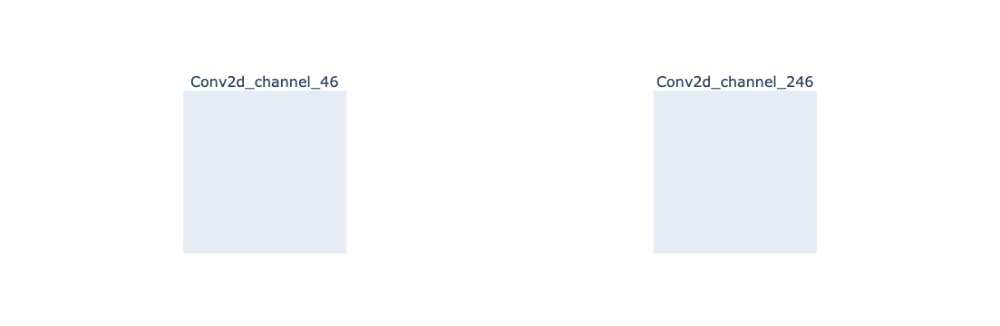

In [8]:
target_layer = model.features[28]
optimizer = FeatureVisualizer(
    model=model,
    objectives=[{"layer": target_layer, "type": "channel", "index": [46, 246]}]
)
explanations = optimizer.explain(
    num_iterations=500,
    image_shape=(512, 512)
)
explanations.ipython_plot()

It appears that channel 46 does not detect any discernible features. Even after optimization, the resulting feature resembles pure noise. In contrast, channel 246 exhibits some reaction to patterns, albeit they are hardly distinguishable. This highlights the significance of knowing where to focus our exploration efforts.

With a vast number of channels in a CNN model, some channels react strongly to specific features while others remain inactive. This variability underscores the importance of targeted exploration to identify meaningful patterns within the network's representations.

In the next cell, we'll explore one approach to refine our exploration and focus on specific channels for feature visualization.


In [9]:
def loader_unique_class(class_name):
    data = pd.read_csv("./data/sports.csv")
    data["image_path"] = "./data/" + data["filepaths"]
    lbl = LabelEncoder()
    data["labels_encoded"] = lbl.fit_transform(data["labels"])
    data = data[~data['image_path'].str.endswith('.lnk')]
    df = data[data["data set"] == "train"].reset_index(drop=True)
    df = df[df["labels"] == class_name].reset_index(drop=True)
    dataset = CustomDataset(df=df, transform=test_transform())
    dataloader = DataLoader(dataset, batch_size=1, shuffle=False)
    return dataloader


def store_activations(model, dataloader):
    activations = {}
    hooks = []

    def get_activation(name, activations):
        def hook(module, input, output):
            if name not in activations:
                activations[name] = []
            activations[name].append(output.detach().cpu().numpy())
        return hook

    for name, module in model.named_modules():
        if isinstance(module, nn.Conv2d):
            hook = module.register_forward_hook(get_activation(name, activations))
            hooks.append(hook)

    for inputs, labels, _ in dataloader:
        inputs = inputs.to(device)
        with torch.no_grad():
            model(inputs)

    for hook in hooks:
        hook.remove()

    # Concatenate activations across all batches
    for name in activations:
        activations[name] = np.concatenate(activations[name], axis=0)

    return activations

def find_most_activated_filters(activations):
    most_activated_filters = {}

    for layer, activation_map in activations.items():
        # Calculate mean absolute activation across the batch dimension
        mean_abs_activations = np.mean(np.abs(activation_map), axis=(0, 2, 3))  # Shape: (num_filters,)

        # Find the index of the filter with the highest mean absolute activation
        most_activated_index = np.argmax(mean_abs_activations)

        # Retrieve the mean activation of the most positively activated filter
        mean_activation = mean_abs_activations[most_activated_index]

        # Store the index of the most positively activated filter along with its mean activation
        most_activated_filters[layer] = {
            'index': most_activated_index,
            'mean_activation': mean_activation
        }

    return most_activated_filters



One approach is to compute the activation during the forward pass of an interesting image. By doing so, we can calculate the average activation for each channel of a feature and determine which channels are the most activated. This method provides valuable insights into where to focus our attention, particularly when targeting a specific class.

By identifying the channels that are most activated for a particular feature, we can gain a better understanding of the network's response to different inputs. This information can guide our exploration efforts, enabling us to focus on channels that are most relevant to the task at hand, such as classifying specific objects or patterns.

In the next step, we'll implement this approach to pinpoint the channels that are most responsive to the features of interest, thereby facilitating more targeted and effective feature visualization.


In [10]:
# define a loader with only curling image
dataloader = loader_unique_class('formula 1 racing')

# get activations for all curling images
activations = store_activations(model, dataloader)

# find the most activated filters per conv2d layer
most_activated_filter = find_most_activated_filters(activations)
for layer, info in most_activated_filter.items():
    print(layer, info)

features.0 {'index': 12, 'mean_activation': 1.875897}
features.2 {'index': 26, 'mean_activation': 1.4599234}
features.5 {'index': 68, 'mean_activation': 3.264232}
features.7 {'index': 72, 'mean_activation': 2.863243}
features.10 {'index': 31, 'mean_activation': 4.2268596}
features.12 {'index': 65, 'mean_activation': 4.045902}
features.14 {'index': 193, 'mean_activation': 5.303116}
features.17 {'index': 23, 'mean_activation': 5.4730763}
features.19 {'index': 380, 'mean_activation': 4.916078}
features.21 {'index': 255, 'mean_activation': 4.862229}
features.24 {'index': 385, 'mean_activation': 4.253003}
features.26 {'index': 262, 'mean_activation': 3.9903238}
features.28 {'index': 443, 'mean_activation': 7.653149}


---
This function computes the average of the absolute value per channel of a convolutional layer. However, it can be easily modified to examine other aspects. The objective is to identify filters that may be informative during visualization. For example, you can experiment with options such as including or excluding the absolute value, using summation instead of averaging, or exploring layers other than conv2d.The results of this function provide valuable insights. For instance, for the layer `model.features[28]`, we find that the filters most activated on average for the curling class include filter 146. This information can guide our selection of filters for further exploration and visualization, allowing us to focus on the most informative features for the task at hand.

Let's have a look at it.


/home/arthur.babey/miniconda3/envs/rules2/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning:

The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).



Step: 600 |████████████████████████████████████████| 100.0% 


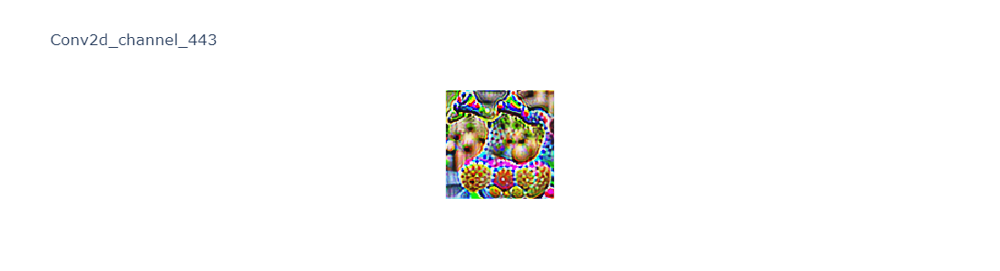

In [26]:
target_layer = model.features[28]
optimizer = FeatureVisualizer(
    model=model,
    objectives=[{"layer": target_layer, "type": "channel", "index": [443]}]
)
explanations = optimizer.explain(
    num_iterations=600,
    image_shape=(100, 100)
)
explanations.ipython_plot()

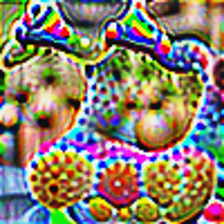

In [27]:
im = explanations.explanations[0]['image'][0].resize((224,224))
im

Step: 300 |████████████████████████████████████████| 100.0% 


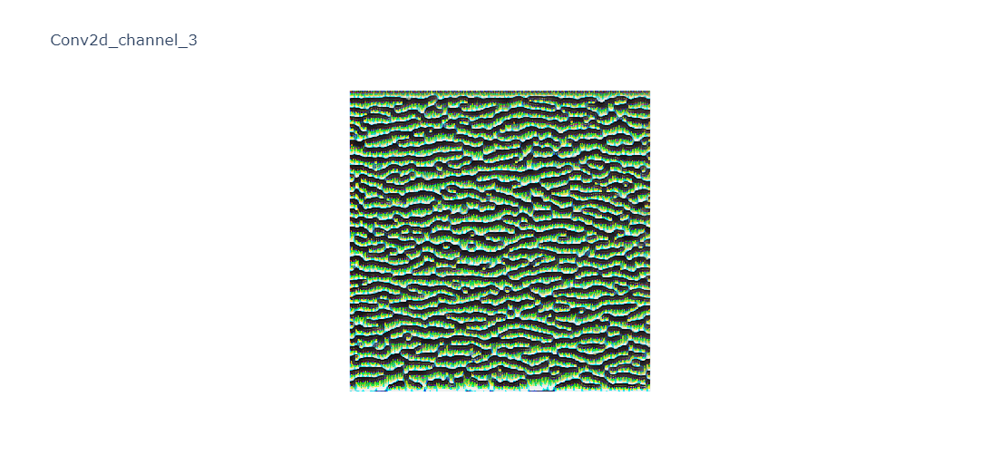

In [12]:
target_layer = model.features[5]
optimizer = FeatureVisualizer(
    model=model,
    objectives=[{"layer": target_layer, "type": "channel", "index": [3]}]
)
explanations = optimizer.explain(
    num_iterations=300,
    image_shape=(512, 512)
)
explanations.ipython_plot()

# fpijfprej


In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image

class SaveFeatures():
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output):
        self.features = output.clone().requires_grad_(True)
    def close(self):
        self.hook.remove()

class FilterVisualizer():
    def __init__(self, model, size=56, upscaling_steps=12, upscaling_factor=1.2):
        self.size, self.upscaling_steps, self.upscaling_factor = size, upscaling_steps, upscaling_factor
        self.model = model.cuda().eval()
        for param in self.model.parameters():
            param.requires_grad = False

    def visualize(self, layer, filter, lr=0.1, opt_steps=250, blur=None):
        sz = self.size
        img = np.uint8(np.random.uniform(150, 180, (sz, sz, 3)))  # generate random image
        img = Image.fromarray(img)
        activations = SaveFeatures(list(self.model.features.children())[layer])  # register hook

        for _ in range(self.upscaling_steps):  # scale the image up upscaling_steps times
            img_tensor = transforms.Compose([
                transforms.Resize((sz, sz)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ])(img).unsqueeze(0).cuda().requires_grad_(True)
            print(img_tensor.shape)
            optimizer = optim.Adam([img_tensor], lr=lr, weight_decay=1e-6)
            for n in range(opt_steps):  # optimize pixel values for opt_steps times
                optimizer.zero_grad()
                self.model.features(img_tensor)
                print(activations.features[0, filter].shape)
                loss = -activations.features[0, filter].mean()
                loss.backward()
                optimizer.step()
            img = transforms.Compose([
                transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255], std=[1/0.229, 1/0.224, 1/0.255]),
                transforms.ToPILImage()
            ])(img_tensor.cpu().squeeze())
            self.output = img
            sz = int(self.upscaling_factor * sz)  # calculate new image size
            print(sz, self.upscaling_factor)
            img = img.resize((sz, sz), Image.BICUBIC)  # scale image up
            if blur is not None:
                img = img.filter(ImageFilter.GaussianBlur(blur))  # blur image to reduce high frequency patterns
        activations.close()
        return self.output

    def plot(self, layer, filter, lr=0.5, opt_steps=20, blur=None):
        img = self.visualize(layer, filter, lr, opt_steps, blur)
        plt.imshow(img)
        plt.axis('off')
        plt.show()


torch.Size([1, 3, 56, 56])
torch.Size([56, 56])
torch.Size([56, 56])
torch.Size([56, 56])
67 1.2
torch.Size([1, 3, 67, 67])
torch.Size([67, 67])
torch.Size([67, 67])
torch.Size([67, 67])
80 1.2
torch.Size([1, 3, 80, 80])
torch.Size([80, 80])
torch.Size([80, 80])
torch.Size([80, 80])
96 1.2
torch.Size([1, 3, 96, 96])
torch.Size([96, 96])
torch.Size([96, 96])
torch.Size([96, 96])
115 1.2
torch.Size([1, 3, 115, 115])
torch.Size([115, 115])
torch.Size([115, 115])
torch.Size([115, 115])
138 1.2
torch.Size([1, 3, 138, 138])
torch.Size([138, 138])
torch.Size([138, 138])
torch.Size([138, 138])
165 1.2
torch.Size([1, 3, 165, 165])
torch.Size([165, 165])
torch.Size([165, 165])
torch.Size([165, 165])
198 1.2
torch.Size([1, 3, 198, 198])
torch.Size([198, 198])
torch.Size([198, 198])
torch.Size([198, 198])
237 1.2
torch.Size([1, 3, 237, 237])
torch.Size([237, 237])
torch.Size([237, 237])
torch.Size([237, 237])
284 1.2
torch.Size([1, 3, 284, 284])
torch.Size([284, 284])
torch.Size([284, 284])
torch.

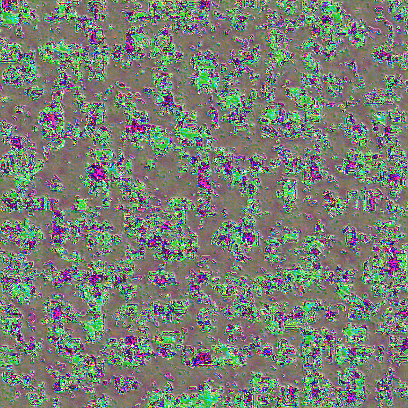

In [7]:
fv = FilterVisualizer(model)
fv.visualize(layer=1, filter=22, lr=0.5, opt_steps=3)

In [140]:
import torchvision.models as models
model = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)

In [137]:
import torch
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image

class SaveFeatures():
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output):
        self.features = output.clone().requires_grad_(True)
    def close(self):
        self.hook.remove()

class FilterVisualizer():
    def __init__(self, model, input_size=224):
        self.input_size = input_size
        self.model = model.cuda().eval()
        for param in self.model.parameters():
            param.requires_grad = False

    def visualize(self, layer, filter, lr=0.1, opt_steps=250):
        sz = self.input_size
        img = np.uint8(np.random.uniform(150, 180, (sz, sz, 3)))  # generate random image
        img = Image.fromarray(img)
        activations = SaveFeatures(list(self.model.features.children())[layer])  # register hook

        img_tensor = transforms.Compose([
            transforms.Resize((sz, sz)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])(img).unsqueeze(0).cuda().requires_grad_(True)

        optimizer = optim.Adam([img_tensor], lr=lr, weight_decay=1e-6)
        for n in range(opt_steps):  # optimize pixel values for opt_steps times
            optimizer.zero_grad()
            self.model.features(img_tensor)
            loss = -activations.features[0, filter].mean()
            loss.backward()
            optimizer.step()

        img = transforms.Compose([
            transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255], std=[1/0.229, 1/0.224, 1/0.255]),
            transforms.ToPILImage()
        ])(img_tensor.cpu().squeeze())
        self.output = img

        activations.close()
        return self.output

    def plot(self, layer, filter, lr=0.5, opt_steps=20):
        img = self.visualize(layer, filter, lr, opt_steps)
        plt.imshow(img)
        plt.axis('off')
        plt.show()


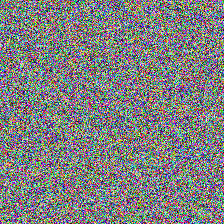

In [134]:
    def visualize(self, layer, filter, lr=0.1, opt_steps=250, blur=None):
        sz = self.size
        img = np.uint8(np.random.uniform(150, 180, (sz, sz, 3)))  # generate random image
        img = Image.fromarray(img)
        activations = SaveFeatures(list(self.model.features.children())[layer])  # register hook

        for _ in range(self.upscaling_steps):  # scale the image up upscaling_steps times
            img_tensor = transforms.Compose([
                transforms.Resize((sz, sz)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ])(img).unsqueeze(0).cuda().requires_grad_(True)
            print(img_tensor.shape)
            optimizer = optim.Adam([img_tensor], lr=lr, weight_decay=1e-6)
            for n in range(opt_steps):  # optimize pixel values for opt_steps times
                optimizer.zero_grad()
                self.model.features(img_tensor)
                print(activations.features[0, filter].shape)
                loss = -activations.features[0, filter].mean()
                loss.backward()
                optimizer.step()
            img = transforms.Compose([
                transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255], std=[1/0.229, 1/0.224, 1/0.255]),
                transforms.ToPILImage()
            ])(img_tensor.cpu().squeeze())
            self.output = img
            sz = int(self.upscaling_factor * sz)  # calculate new image size
            img = img.resize((sz, sz), Image.BICUBIC)  # scale image up
            if blur is not None:
                img = img.filter(ImageFilter.GaussianBlur(blur))  # blur image to reduce high frequency patterns
        activations.close()
        return self.output

## TEST SIZE 2

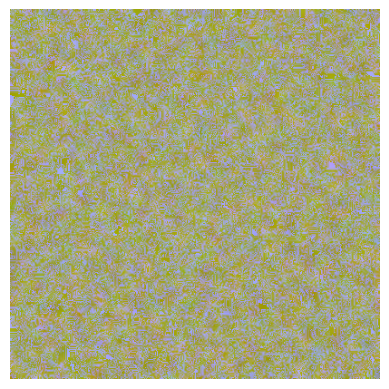

In [11]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
import matplotlib.pyplot as plt

class FeatureVisualizer:
    def __init__(self, model, target_layer):
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = model.to(self.device)
        self.target_layer = target_layer
        self.model.eval()
        self.generated_image = nn.Parameter(torch.randn(1, 3, 224, 224).to(self.device))  # Initialize with random noise
        self.optimizer = optim.Adam([self.generated_image], lr=0.1)
        self.normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        self.denormalize = transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
                                                std=[1/0.229, 1/0.224, 1/0.225])
        
    def visualize(self, target_filter, num_iterations=20):
        sz = 56
        upscaling_factor = 1.2
        img = np.uint8(np.random.uniform(150, 180, (sz, sz, 3)))  # generate random image
        img = Image.fromarray(img)
        for _ in range(12):
            img_tensor = transforms.Compose([
                transforms.Resize((sz, sz)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ])(img).unsqueeze(0).cuda().requires_grad_(True)
            optimizer = optim.Adam([img_tensor], lr=0.1, weight_decay=1e-6)
        
            for i in range(num_iterations):
                self.optimizer.zero_grad()
                img_tensor = img_tensor.cuda().requires_grad_(True)
                features = self.model.features[:self.target_layer](img_tensor)
                target_activation = features[0, target_filter, :, :]
                loss = -torch.mean(target_activation)  # Maximize activation
                loss.backward()
                self.optimizer.step()
            img = transforms.Compose([
                transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255], std=[1/0.229, 1/0.224, 1/0.255]),
                transforms.ToPILImage()
            ])(img_tensor.cpu().squeeze())
            self.output = img
            sz = int(upscaling_factor * sz)
            img = img.resize((sz, sz), Image.BICUBIC)  # scale image up
        return self.output
    
    def norm(self, img):
        return self.normalize(img)
    
    def unorm(self, img):
        return torch.clamp(self.denormalize(img.cpu()), 0, 1)

# Usage
target_layer = 28
visualizer = FeatureVisualizer(model, target_layer)
target_filter = 55
generated_image = visualizer.visualize(target_filter, num_iterations=200)

# Plot the unnormalized image
plt.imshow(generated_image)
plt.axis('off')
plt.show()


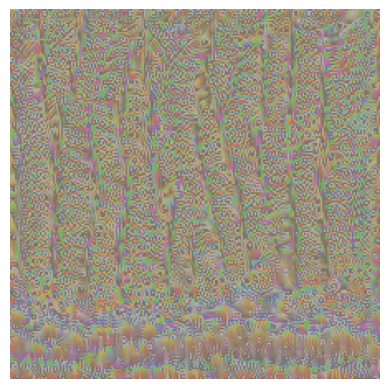

In [200]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
import matplotlib.pyplot as plt

class FeatureVisualizer:
    def __init__(self, model, target_layer):
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = model.to(self.device)
        self.target_layer = target_layer
        self.model.eval()
        self.generated_image = nn.Parameter(torch.randn(1, 3, 224, 224).to(self.device))  # Initialize with random noise
        self.optimizer = optim.Adam([self.generated_image], lr=0.1)
        self.normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        self.denormalize = transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
                                                std=[1/0.229, 1/0.224, 1/0.225])
        
    def visualize(self, target_filter, num_iterations=300):
        for i in range(num_iterations):
            self.optimizer.zero_grad()
            self.generated_image.data = self.generated_image.data.to(self.device)  # Move generated image to device
            normalized_image = self.normalize(self.generated_image)
            features = self.model.features[:self.target_layer](normalized_image)
            target_activation = features[0, target_filter, :, :]
            loss = -torch.mean(target_activation)  # Maximize activation
            loss.backward()
            self.optimizer.step()
            # Clipping the image to be in the valid range [0, 1]
            self.generated_image.data.clamp_(0, 1)
        
        return self.generated_image.data.squeeze()
    
    def unnormalize_image(self, img):
        denormalized_img = self.denormalize(img.cpu())
        #return torch.clamp(denormalized_img, 0, 1)
        return denormalized_img

# Usage
target_layer = 28
visualizer = FeatureVisualizer(model, target_layer)
target_filter = 55
generated_image = visualizer.visualize(target_filter)

# Unnormalize the image before plotting
unnormalized_image = visualizer.unnormalize_image(generated_image)

# Plot the unnormalized image
plt.imshow(unnormalized_image.permute(1, 2, 0))
plt.axis('off')
plt.show()


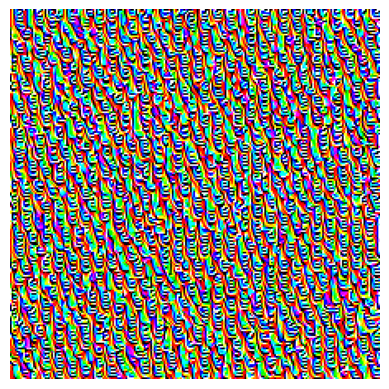

In [181]:
plt.imshow(unnormalized_image.permute(1, 2, 0))
plt.axis('off')
plt.show()

In [1]:
!git branch

* feature_demo
  main
  rules_demo


In [ ]:
import torch
from torchsummary import summary
from efficientnet_pytorch import EfficientNet

# Replace 'efficientnet-b0' with the desired EfficientNet variant
model = EfficientNet.from_pretrained('efficientnet-b7')
model.to(torch.device('cuda'))
# Input size for EfficientNet-B0
input_size = (3, 224, 224)

# Use torchsummary to get a summary of the model
summary(effnet, input_size)

In [ ]:
model.parameters()[-1].device

In [ ]:
target_layer=effnet.model.features[-1]

## OmniXAI implementation 

In [ ]:
model

In [ ]:
target_layer = effnet.model.features[-4][0].block[0][0]
target_layer

In [ ]:
from omnixai.explainers.vision.specific.feature_visualization.visualizer import FeatureVisualizer

In [ ]:
optimizer2 = FeatureVisualizer(
    model=effnet.model,
    objectives=[{"layer": target_layer, "type": "layer"}]
)

explanations2 = optimizer2.explain(
    num_iterations=300,
    image_shape=(512, 512),
    use_fft=True
)
explanations2.ipython_plot()

In [ ]:
!pip install plotly

In [ ]:
import torch

def find_max_activated_channels(model, img):
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        img_tensor = torch.tensor(img).unsqueeze(0)  # Assuming img is a numpy array
        max_activated_channels = {}

        # Iterate through all layers
        for name, layer in model.named_modules():
            if isinstance(layer, torch.nn.Conv2d):
                activations = None

                # Hook to retrieve activations from the current layer
                def hook(module, input, output):
                    nonlocal activations
                    activations = output

                # Register the hook to the current layer
                hook_handle = layer.register_forward_hook(hook)

                # Forward pass
                outputs = model(img_tensor)

                # Remove the hook after obtaining activations
                hook_handle.remove()

                # Calculate average activation for each channel across all pixels
                avg_activations = torch.mean(activations, dim=(2, 3))  # Calculate mean along height and width

                # Find the index of the channel with the maximum average activation
                max_activated_channel = torch.argmax(torch.mean(avg_activations, dim=0)).item()

                # Store the layer name and max activated channel index
                max_activated_channels[name] = max_activated_channel

    return max_activated_channels


In [ ]:
!ls models_weight/

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F

In [ ]:
class FineTunedVGG(nn.Module):
    def __init__(self, trunc=7):
        super(FineTunedVGG, self).__init__()
        vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)  # Load pre-trained VGG16 model
        
        vgg.classifier[-1] = nn.Linear(4096, 100)  # Modify the last fully connected layer
        self.features = vgg.features
        self.avgpool = vgg.avgpool
        self.classifier = vgg.classifier
        self.trunc = trunc
        
        # Freeze all layers
        for param in vgg.parameters():
            param.requires_grad = False
        
        for param in vgg.classifier[-1].parameters():
            param.requires_grad = True 
        for param in vgg.classifier[-4].parameters():
            param.requires_grad = True             
    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier[:self.trunc](x) # 3 or 6 (after relu dropout of fc1 or fc2)
        max_val = torch.max(x)
        x = x + torch.abs(max_val)*5
        # x = F.relu(x)


In [ ]:
vgg = FineTunedVGG()

In [ ]:
checkpoint = torch.load(os.path.join("./models_weight/VGGFineTuned.pth"), map_location=device)
vgg.load_state_dict(checkpoint['model_state_dict'])
vgg.to(device)
print("Model state loaded :)")

In [ ]:
vgg.classifier[6]

In [ ]:
from PIL import Image
from IPython.display import display

for i in range(14, 30, 1):
    target_layer = model.features[i]
    optimizer2 = FeatureVisualizer(
    model=model,
    objectives=[{"layer": target_layer, "type": "layer"}]
    )
    explanations2 = optimizer2.explain(
        num_iterations=600,
        image_shape=(224, 225),
        use_fft=True
    )
    # Get the explanation image and resize it
    explanation_image = explanations2.get_explanations()['image'][0]
    resized_image = explanation_image.resize((512, 512))

    # Display the resized image within the notebook
    print(f"Layer {i}")
    display(resized_image)


In [ ]:
from PIL import Image
from IPython.display import display

for i in range(14, 30, 1):
    target_layer = model.features[i]
    optimizer2 = FeatureVisualizer(
    model=model,
    objectives=[{"layer": target_layer, "type": "layer"}]
    )
    explanations2 = optimizer2.explain(
        num_iterations=600,
        image_shape=(224, 225),
        use_fft=True
    )
    # Get the explanation image and resize it
    explanation_image = explanations2.get_explanations()['image'][0]
    resized_image = explanation_image.resize((512, 512))

    # Display the resized image within the notebook
    print(f"Layer {i}")
    display(resized_image)


In [ ]:
from PIL import Image
from IPython.display import display

In [ ]:
target_layer = vgg.features[28]
optimizer = FeatureVisualizer(
    model=vgg,
    objectives=[{"layer": target_layer, "type": "neuron", "index": [651555, 443]}]
)
explanations = optimizer.explain(
    num_iterations=5,
    image_shape=(512, 512),
    use_fft=True
)
explanations.ipython_plot()

In [ ]:
# load trained model VGG
model = FineTunedVGG()
model = model.to(device)
model.eval()

target_layer = model.features[-1]
optimizer = FeatureVisualizer(
    model=model,
    objectives=[{"layer": target_layer, "type": "channel", "index": [78, 114]}]
)
explanations = optimizer.explain(
    num_iterations=300,
    image_shape=(512, 512),
    use_fft=True
)
explanations.ipython_plot()

In [ ]:
def transform():
    return transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.RandomRotation(20),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])


def loader_unique_class(class_name):
    data = pd.read_csv("./data/sports.csv")
    data["image_path"] = "./data/" + data["filepaths"]
    lbl = LabelEncoder()
    data["labels_encoded"] = lbl.fit_transform(data["labels"])
    df = data[data["data set"] == "train"].reset_index(drop=True)
    df = df[df["labels"] == class_name].reset_index(drop=True)
    dataset = CustomDataset(df=df, transform=transform())
    dataloader = DataLoader(dataset, batch_size=1, shuffle=False)
    return dataloader


def store_activations(model, dataloader):
    activations = {}
    hooks = []

    def get_activation(name, activations):
        def hook(module, input, output):
            if name not in activations:
                activations[name] = []
            activations[name].append(output.detach().cpu().numpy())
        return hook

    for name, module in model.named_modules():
        if isinstance(module, nn.Conv2d):
            print(name)
            hook = module.register_forward_hook(get_activation(name, activations))
            hooks.append(hook)

    for inputs, labels, _ in dataloader:
        inputs = inputs.to(device)
        with torch.no_grad():
            model(inputs)

    for hook in hooks:
        hook.remove()

    # Concatenate activations across all batches
    for name in activations:
        activations[name] = np.concatenate(activations[name], axis=0)

    return activations


In [ ]:
vgg = FineTunedVGG()
checkpoint = torch.load(os.path.join("./models_weight/VGG_013fixedlayers.pth"), map_location=device)
vgg.load_state_dict(checkpoint['model_state_dict'])
vgg.to(device)
print("Model state loaded :)")

In [ ]:
data = pd.read_csv("./data/sports.csv")
data["image_path"] = "./data/" + data["filepaths"]
lbl = LabelEncoder()
data["labels_encoded"] = lbl.fit_transform(data["labels"])
df = data[data["data set"] == "train"].reset_index(drop=True)
df = df[df["labels"] == 'air hockey'].reset_index(drop=True)
dataset = CustomDataset(df=df, transform=transform())
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

In [ ]:
activations = store_activations(vgg, dataloader)

In [ ]:
def find_most_activated_filters(activations):
    most_activated_filters = {}

    for layer, activation_map in activations.items():
        # Calculate mean activation across the batch dimension
        mean_activations = np.mean(activation_map, axis=(0, 2, 3))  # Shape: (num_filters,)

        # Find the index of the filter with the highest mean activation
        most_activated_index = np.argmax(mean_activations)
        most_activated_neg_index = np.argmin(mean_activations)

        # Store the index of the most activated filter along with its mean activation
        most_activated_filters[layer] = {
            'index_pos': most_activated_index,
            'mean_activation_pos': mean_activations[most_activated_index],
            'index_neg': most_activated_neg_index,
            'mean_activation_neg': mean_activations[most_activated_neg_index]
        }

    return most_activated_filters

# Example usage:
most_activated_filters = find_most_activated_filters(activations)

# Print the most activated filters for each layer
for layer, info in most_activated_filters.items():
    print(f"Layer: {layer}, Most Positively Activated Filter Index: {info['index_pos']}, Mean Activation (Positive): {info['mean_activation_pos']}")
    print(f"Layer: {layer}, Most Negatively Activated Filter Index: {info['index_neg']}, Mean Activation (Negative): {info['mean_activation_neg']}")
